In [1]:
import warnings
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
from helper import configure_matplotlib, create_arima_model, get_best_parameters, format_excel_file, write_to_excel

In [2]:
# basic configuration
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)
pd.set_option('display.max_columns', 500)

In [3]:
formatted_df = pd.read_csv("pipe_dataset.csv", index_col=0)
formatted_df.index = pd.to_datetime(formatted_df.index)
formatted_df.head()

,8705902546,8716113919,8718640762,8718640763,8718640787,8718645319,8718647378,8718649158,8718649167,8718649588,8718649589,8718651804,8718653366,8718654166,8718696020,8718696337,8718698387,8718699250,8719905826,8750306523
2021-09-26,102.0,102.0,2192.0,2168.0,2168.0,2352.0,2376.0,5547.0,5547.0,5371.0,3481.0,102.0,102.0,2376.0,102.0,102.0,102.0,102.0,2956.0,102.0
2021-10-03,2130.0,2130.0,2357.0,3253.0,3253.0,484.0,484.0,4800.0,4800.0,4800.0,2538.0,2130.0,2130.0,484.0,2130.0,2130.0,2130.0,2130.0,2064.0,2130.0
2021-10-10,1398.0,1758.0,4918.0,4842.0,4842.0,3196.0,3236.0,3426.0,3426.0,3426.0,2034.0,1758.0,1398.0,3236.0,1758.0,1758.0,1758.0,1758.0,3205.0,1758.0
2021-10-17,600.0,654.0,2897.0,2537.0,2537.0,4774.0,4782.0,7874.0,7874.0,7874.0,1902.0,654.0,600.0,4782.0,654.0,654.0,654.0,654.0,1444.0,654.0
2021-10-24,2190.0,2748.0,860.0,1308.0,1308.0,5556.0,5556.0,7025.0,7025.0,7025.0,3791.0,2748.0,2190.0,5556.0,2748.0,2748.0,2748.0,2748.0,2154.0,2748.0


In [4]:
from statsmodels.tsa.seasonal import seasonal_decompose

configure_matplotlib(platform='vscode')
for i in range(0, len(formatted_df.columns)):
    selected_pipe = formatted_df.columns[i]
    seasons = seasonal_decompose(formatted_df[selected_pipe], model='additive', period=7, filt=None, two_sided=True,
                                 extrapolate_trend=0)
    ax = plt.subplot(len(formatted_df.columns), 1, i + 1)
    ax.figure.set_size_inches(20, i * 3)
    ax.figure.set_dpi(300)
    seasons.seasonal.plot(ax=ax, legend=False, marker='o', markersize=7, linewidth=2)
    ax.set_title(f"Pipe TTNr: {formatted_df.columns[i]}", fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.margins(x=40)
    plt.subplots_adjust(hspace=1, wspace=0)

plt.show()

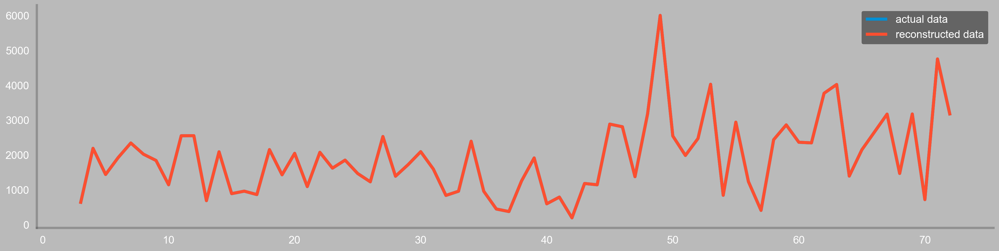

In [5]:
# Y = trend + seasonal + residual + noise

# get the trend, seasonal and residual
seasons = seasonal_decompose(formatted_df[formatted_df.columns[0]], model='additive', period=7, filt=None, two_sided=True, extrapolate_trend=0)
seasonal = seasons.seasonal.values
trend = seasons.trend.values
residual = seasons.resid.values

# use the trend, seasonal and residual to create the data
# data = np.array([trend[i] + seasonal[i] + residual[i] if not np.isnan(trend[i] + seasonal[i] + residual[i]) else 0 for i in range(len(trend))])
data = trend + seasonal + residual

# add noise to the data
noise = np.random.normal(0, 200, len(data))
noisy_data = data + noise

# plot the actual and reconstructed data with noise
plt.figure(figsize=(20, 5))
plt.plot(data, label='actual data')
# plt.plot(trend, label='trend')
# plt.plot(seasonal, label='seasonal')
plt.plot(data, label='reconstructed data')
plt.legend()
plt.show()

In [25]:
behaviors = pd.DataFrame(index=formatted_df.index[:7], columns=formatted_df.columns)

for index, pipe in enumerate(formatted_df.columns):
    behaviors[pipe] = seasonal_decompose(formatted_df[formatted_df.columns[index]], 
                                         model='additive', period=7, filt=None, 
                                         two_sided=True, extrapolate_trend=0).seasonal.values[:7]

behaviors

,8705902546,8716113919,8718640762,8718640763,8718640787,8718645319,8718647378,8718649158,8718649167,8718649588,8718649589,8718651804,8718653366,8718654166,8718696020,8718696337,8718698387,8718699250,8719905826,8750306523
2021-09-26,46.371429,19.959184,367.738776,320.487755,320.487755,256.114286,242.130612,647.397959,647.397959,669.381633,167.548980,18.502041,44.914286,242.130612,18.502041,18.502041,18.502041,18.502041,339.534694,27.734694
2021-10-03,-226.742857,-207.383673,283.953061,-7.026531,-7.026531,-173.871429,-187.912245,439.412245,439.412245,358.795918,39.934694,-209.640816,-229.000000,-187.912245,-209.640816,-209.640816,-209.640816,-209.640816,-218.808163,-199.108163
2021-10-10,-214.685714,-216.497959,-179.146939,-256.497959,-256.497959,661.514286,649.873469,335.883673,335.883673,327.467347,377.277551,-218.755102,-216.942857,649.873469,-218.755102,-218.755102,-218.755102,-218.755102,263.091837,-277.822449
2021-10-17,-34.785714,-76.455102,-16.032653,-164.797959,-164.797959,86.185714,73.344898,90.255102,90.255102,114.753061,-117.251020,-78.712245,-37.042857,73.344898,-78.712245,-78.712245,-78.712245,-78.712245,-130.551020,-36.036735
2021-10-24,485.885714,569.616327,-162.446939,317.844898,317.844898,118.828571,152.330612,-192.487755,-192.487755,-170.504082,204.220408,567.359184,483.628571,152.330612,567.359184,567.359184,567.359184,567.359184,157.834694,610.034694
2021-10-31,-474.871429,-508.740816,-254.904082,-300.383673,-300.383673,-503.385714,-492.283673,-919.959184,-919.959184,-897.975510,-652.065306,-510.997959,-477.128571,-492.283673,-510.997959,-510.997959,-510.997959,-510.997959,-119.136735,-562.522449
2021-11-07,418.828571,419.502041,-39.161224,90.373469,90.373469,-445.385714,-437.483673,-400.502041,-400.502041,-401.918367,-19.665306,432.244898,431.571429,-437.483673,432.244898,432.244898,432.244898,432.244898,-291.965306,437.720408


In [26]:
# write the behaviors to excel
behaviors.to_excel(f"{os.getcwd()}/pipe_behaviors.xlsx", sheet_name='General')
format_excel_file(f"{os.getcwd()}/pipe_behaviors.xlsx", sheet_name='General', first_column_width=20)

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

for i in range(len(formatted_df.columns)):
    _, ax = plt.subplots(figsize=(25, 4))
    plot_acf(formatted_df[formatted_df.columns[i]], lags=14, ax=ax, title=f"(ACF) Pipe TTNr: {formatted_df.columns[i]}")

    _, ax = plt.subplots(figsize=(25, 4))
    plot_pacf(formatted_df[formatted_df.columns[i]], lags=14, ax=ax,
              title=f"(PACF) Pipe TTNr: {formatted_df.columns[i]}")

In [28]:
models, fc_series_dict, lower_series_dict, upper_series_dict, rmse_dict = {}, {}, {}, {}, {}
rmse_list, mae_list, mape_list, mase_list = {}, {}, {}, {}
best_performers = {}
order_dict, seasonal_order_dict = {}, {}
pipe_counter = 0

outer_loop = tqdm(formatted_df.columns, desc=f'Pipe TTNr: {formatted_df.columns[pipe_counter]}',
                  total=len(formatted_df.columns), ncols=100)

for pipe in outer_loop:
    for i in range(7, 15):
        fc_series, lower_series, upper_series, fitted, errors, order, seasonal_order = create_arima_model(
            df=formatted_df,
            selected_pipe=pipe,
            m=i,
            test="adf",
            model_type="sarimax",
            max_p=10, max_q=10,
            trace=False)
        rmse_list[i], mae_list[i], mape_list[i], mase_list[i] = errors["rmse"], errors["mae"], errors["mape"], errors["mase"]
        order_dict[i], seasonal_order_dict[i] = order, seasonal_order

    outer_loop.set_description(f'Pipe TTNr: {formatted_df.columns[pipe_counter]}', refresh=True)

    pipe_counter += 1
    best_parameters = get_best_parameters(rmse_list, mae_list, mape_list, mase_list, best_performers, pipe, order_dict,
                                          seasonal_order_dict)

In [29]:
# calculate the max value for each column and add as a new row
org_max_values = formatted_df.max(axis=0)
org_min_values = formatted_df.min(axis=0)
org_avg_values = formatted_df.mean(axis=0)
org_df = pd.concat([org_max_values, org_min_values, org_avg_values], axis=1)
org_df.columns = ['org_max', 'org_min', 'org_avg']

In [30]:
import json

with open('best_performing_periods.json', 'w') as fp:
    json.dump(best_performers, fp)

In [31]:
with open('best_performing_periods.json', 'r') as fp:
    best_performers = json.load(fp)

In [ ]:
models, fc_series_dict, lower_series_dict, upper_series_dict, rmse_dict = {}, {}, {}, {}, {}
aic_values, bic_values = {}, {}
pipe_counter = 0
loop = tqdm(formatted_df.columns, desc=f'Pipe TTNr: {formatted_df.columns[pipe_counter]}',
            total=len(formatted_df.columns), ncols=100)

for pipe in loop:
    fc_series, lower_series, upper_series, fitted, errors, orders, seasonal_orders = create_arima_model(df=formatted_df,
                                                                                                        selected_pipe=pipe,
                                                                                                        # m=best_performers[pipe]['rmse'],
                                                                                                        m=14,
                                                                                                        test="adf",
                                                                                                        model_type="sarimax",
                                                                                                        max_p=10,
                                                                                                        max_q=10,
                                                                                                        trace=False)
    models[pipe], fc_series_dict[pipe], lower_series_dict[pipe] = fitted, fc_series, lower_series
    upper_series_dict[pipe], rmse_dict[pipe] = upper_series, errors["rmse"]

    aic_values[pipe] = fitted.aic
    bic_values[pipe] = fitted.bic

    loop.set_description(f'Pipe TTNr: {formatted_df.columns[pipe_counter]}', refresh=True)

    pipe_counter += 1

    # print(f"Pipe TTNr: {pipe} - Period: {best_performers[pipe]} - RMSE: {errors['rmse']:.2f} - MAE: {errors['mae']:.2f} - MAPE: {errors['mape']:.2f} - MASE: {errors['mase']:.2f} - AIC: {aic_values[pipe]:.2f} - BIC: {bic_values[pipe]:.2f}")

In [156]:
# compare the predictions to the actual values
# for pipe in formatted_df.columns:
#     fc_series = fc_series_dict[pipe]
#     lower_series = lower_series_dict[pipe]
#     upper_series = upper_series_dict[pipe]
#     plt.figure(figsize=(20, 5), dpi=300)
#     plt.plot(formatted_df[pipe], label='actual', linewidth=2)
#     plt.plot(fc_series, label='forecast', linewidth=2)
#     plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.15)
#     plt.title(f"Pipe TTNr: {pipe}", fontsize=16)
#     plt.legend(loc='upper right', fontsize=12)
#     plt.show()

In [54]:
forecast_df = pd.DataFrame(columns=[*formatted_df.columns],
                           index=pd.date_range(start=formatted_df.index[-1] + pd.DateOffset(weeks=1),
                                               periods=52, freq='W-SUN'))

configure_matplotlib(platform='pycharm')
for pipe_index, pipe in enumerate(formatted_df.columns):
    step = 52
    forecast = models[pipe].forecast(steps=step)

    forecast_df.loc[forecast_df.index[:step], pipe] = forecast

    # compare LSTM with actual values
    ax = plt.subplot(len(formatted_df.columns), 1, pipe_index + 1)
    ax.figure.set_size_inches(30, 10 if pipe_index == 0 else pipe_index * 10)

    # plot the actual and forecast values
    ax.set_title(f"Pipe TTNr: {pipe} - RMSE: {rmse_dict[pipe]:.2f}")
    ax.plot(formatted_df[pipe], label='training', marker='o')
    ax.plot(forecast_df[pipe], label='forecast', marker='o')
    ax.plot([formatted_df.index[-1], forecast_df.index[0]], [formatted_df[pipe].iloc[-1], forecast_df[pipe].iloc[0]],
            marker='o')
    plt.subplots_adjust(hspace=0.6, wspace=0)
    ax.set_xticks([*formatted_df.index, *forecast_df.index])
    ax.margins(x=0.01)
    plt.xticks(rotation=90)

plt.show()

In [47]:
# calculate the max value for each column
forecast_52w_max_values = forecast_df.max(axis=0)
forecast_52w_min_values = forecast_df.min(axis=0)
forecast_52w_avg_values = forecast_df.mean(axis=0)
forecast_52w_df = pd.concat([forecast_52w_max_values, forecast_52w_min_values, forecast_52w_avg_values], axis=1)
forecast_52w_df.columns = ['forecast_52w_max', 'forecast_52w_min', 'forecast_52w_avg']
max_min_avg_df = pd.concat([org_df, forecast_52w_df], axis=1)

In [49]:
max_min_avg_df.head(5)

,org_max,org_min,org_avg,forecast_52w_max,forecast_52w_min,forecast_52w_avg
8705902546,6000.0,102.0,1934.013158,5518.488916,2108.272631,3788.860837
8716113919,6000.0,102.0,1977.197368,5476.802398,2060.271934,3760.617357
8718640762,4918.0,80.0,1900.802632,2802.440978,795.42904,1592.301980
8718640763,5092.0,80.0,1951.000000,3267.921713,1098.052548,1947.359196
8718640787,5092.0,80.0,1951.000000,3267.921713,1098.052548,1947.359196


In [50]:
max_min_avg_df.to_excel(f"{os.getcwd()}/min_max_avg_values.xlsx", sheet_name='Combined')

In [51]:
forecast_df.index = forecast_df.index.strftime("%Y-%m-%d")

In [52]:
# write the forecast to an Excel file
forecast_df.to_excel(f"{os.getcwd()}/forecast_52w.xlsx", sheet_name='Forecast')

In [53]:
format_excel_file(f"{os.getcwd()}/forecast_52w.xlsx", sheet_name='Forecast')
format_excel_file(f"{os.getcwd()}/min_max_avg_values.xlsx", sheet_name='Combined')

In [76]:
write_to_excel(file_dir=f"{os.getcwd()}/supermarket.xlsx", sheet_names=['General', 'Transposed'], df=formatted_df)
format_excel_file(f"{os.getcwd()}/supermarket.xlsx", sheet_name='General', first_column_width=20, first_index="")
format_excel_file(f"{os.getcwd()}/supermarket.xlsx", sheet_name='Transposed', first_index="")